In [1]:
import torchvision.transforms as transforms
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

# Define transformations for training
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomRotation(10),  # 10 degrees random rotation
    transforms.ColorJitter(brightness=0.5, contrast=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization for ResNet
])

# Define transformations for validation (no random transformations)
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load training and validation datasets
train_dataset = ImageFolder(root='/home/hous/Desktop/LLAVA/data3a/training', transform=train_transform)
val_dataset = ImageFolder(root='/home/hous/Desktop/LLAVA/data3a/validation', transform=val_transform)

# Create DataLoaders
batch_size = 32 # Adjust as needed
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


In [2]:
from collections import Counter

# Count the number of images per class in the training dataset
train_class_counts = Counter([label for _, label in train_dataset.imgs])
print("Training Data Class Distribution:", train_class_counts)

# Count the number of images per class in the validation dataset
val_class_counts = Counter([label for _, label in val_dataset.imgs])
print("Validation Data Class Distribution:", val_class_counts)

Training Data Class Distribution: Counter({2: 468, 1: 463, 0: 452})
Validation Data Class Distribution: Counter({2: 91, 0: 82, 1: 75})


In [3]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.optim import Adam

In [4]:
class SpatialAttentionModule(nn.Module):
    def __init__(self):
        super(SpatialAttentionModule, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=2048, out_channels=512, kernel_size=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels=512, out_channels=1, kernel_size=1)

    def forward(self, x):
        # x is the feature map from the ResNet model
        attention = self.conv1(x)
        attention = self.relu(attention)
        attention = self.conv2(attention)
        attention = torch.sigmoid(attention)  # Sigmoid to create an attention mask

        return x * attention , attention # Apply attention mask to the input feature map


In [5]:
class ModifiedResNet(nn.Module):
    def __init__(self):
        super(ModifiedResNet, self).__init__()
        # Load pre-trained ResNet and remove its fully connected layer
        self.resnet = models.resnet50(pretrained=True)
        self.resnet = nn.Sequential(*(list(self.resnet.children())[:-2]))

        # Spatial Attention Module
        self.attention = SpatialAttentionModule()

        # Fully connected layer for classification
        self.fc = nn.Linear(2048, 3)  # Assuming 3 classes for severity

    def forward(self, x ,return_attention=False):
        # Extract features from ResNet
        features = self.resnet(x)

        # Apply attention
        attention_applied,attention_map = self.attention(features)

        # Global average pooling
        gap = nn.functional.adaptive_avg_pool2d(attention_applied, (1, 1))
        gap = gap.view(gap.size(0), -1)

        # Classification
        output = self.fc(gap)
        
        if return_attention:
            return output, attention_map
        else:
            return output

In [6]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, logits=True, reduce=True):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduce = reduce

    def forward(self, inputs, targets):
        if self.logits:
            CE_loss = F.cross_entropy(inputs, targets, reduction='none')
        else:
            CE_loss = F.cross_entropy(F.softmax(inputs, dim=1), targets, reduction='none')
        pt = torch.exp(-CE_loss)
        F_loss = self.alpha * (1 - pt)**self.gamma * CE_loss

        if self.reduce:
            return torch.mean(F_loss)
        else:
            return F_loss
criterion = FocalLoss()

In [7]:
model = ModifiedResNet()
#criterion = nn.CrossEntropyLoss()  # For classification tasks
optimizer = Adam(model.parameters(), lr=0.0001)
#optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)


/home/hous/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hous/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [8]:
from torch.optim.lr_scheduler import StepLR

#scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=5, verbose=True)

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision.transforms.functional import to_pil_image, to_tensor
import torch

def visualize_attention(original_img_tensor, attention_map_tensor, threshold=0.5, alpha=0.4):
    # If the original image tensor was normalized, denormalize it
    mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    if original_img_tensor.is_cuda:
        mean = mean.cuda()
        std = std.cuda()
    original_img_tensor = original_img_tensor * std + mean
    original_img_tensor = torch.clamp(original_img_tensor, 0, 1)

    # Convert the original image tensor to a PIL image for display
    original_img = to_pil_image(original_img_tensor)

    # Normalize the attention map tensor
    attention_map = attention_map_tensor.squeeze().detach().numpy()
    attention_map = np.maximum(attention_map, 0)  # Apply ReLU for visualization purposes
    attention_map = attention_map / np.max(attention_map)  # Normalize to [0, 1]

    # Apply threshold to the attention map
    attention_map = np.where(attention_map >= threshold, attention_map, 0)

    # Resize attention map to match the original image size using PIL
    attention_map_resized = Image.fromarray(np.uint8(plt.cm.jet(attention_map) * 255))
    attention_map_resized = attention_map_resized.resize(original_img.size, Image.BILINEAR)

    # Overlay the attention map on the original image
    attention_overlay = np.array(attention_map_resized)[:, :, :3]
    original_image_np = np.array(original_img)

    # Ensure both arrays are of the same shape for overlay
    if attention_overlay.shape != original_image_np.shape:
        attention_overlay = np.repeat(attention_overlay[:, :, np.newaxis], 3, axis=2)

    superimposed_img = np.where(attention_overlay.sum(axis=2, keepdims=True) != 0,
                                (1 - alpha) * original_image_np + alpha * attention_overlay,
                                original_image_np).astype(np.uint8)

    # Display the superimposed image
    plt.imshow(superimposed_img)
    plt.axis('off')  # Hide the axis
    plt.show()

In [10]:
def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    correct_predictions = 0
    total_samples = 0

    for inputs, labels in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total_samples += labels.size(0)
        correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / len(dataloader)
    accuracy = 100 * correct_predictions / total_samples
    return avg_loss, accuracy

In [11]:
def visualize_batch_attention(model, dataloader, device, threshold=0.5, alpha=0.4, num_images=10):
    model.eval()  # Set the model to evaluation mode
    images_processed = 0  # Counter for how many images have been processed

    with torch.no_grad():
        for inputs, _ in dataloader:
            for i in range(min(num_images, inputs.size(0))):  # Process up to num_images
                input_img_tensor = inputs[i].to(device)  # Get the i-th image in the batch

                # Forward pass to get the attention map
                _, attention_map_tensor = model(input_img_tensor.unsqueeze(0), return_attention=True)

                # Visualize the attention mask
                visualize_attention(input_img_tensor.cpu(), attention_map_tensor[0].cpu(), threshold, alpha)

                images_processed += 1
                if images_processed >= num_images:
                    return  # Stop after processing the desired number of images

In [12]:
def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / len(dataloader)
    accuracy = 100 * correct_predictions / total_samples
    return avg_loss, accuracy

Epoch 1/100, Train Loss: 0.3918, Train Accuracy: 54.01%, Validation Loss: 0.3315, Validation Accuracy: 58.06%
Validation loss decreased (inf --> 0.3315). Saving model ...


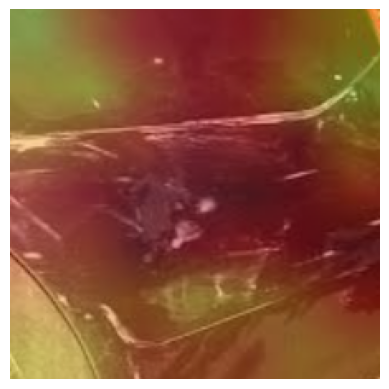

Epoch 2/100, Train Loss: 0.3240, Train Accuracy: 61.89%, Validation Loss: 0.3013, Validation Accuracy: 61.69%
Validation loss decreased (0.3315 --> 0.3013). Saving model ...


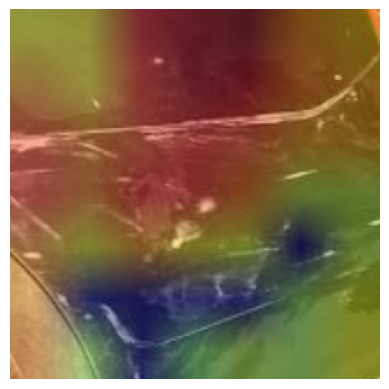

Epoch 3/100, Train Loss: 0.3023, Train Accuracy: 62.98%, Validation Loss: 0.4074, Validation Accuracy: 52.82%


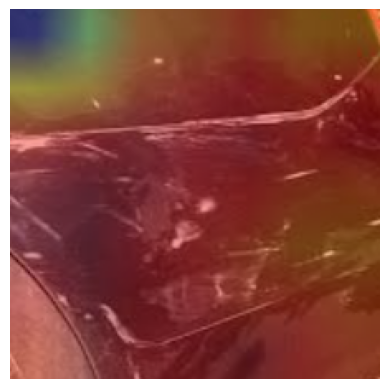

Epoch 4/100, Train Loss: 0.2931, Train Accuracy: 65.08%, Validation Loss: 0.2556, Validation Accuracy: 66.94%
Validation loss decreased (0.3013 --> 0.2556). Saving model ...


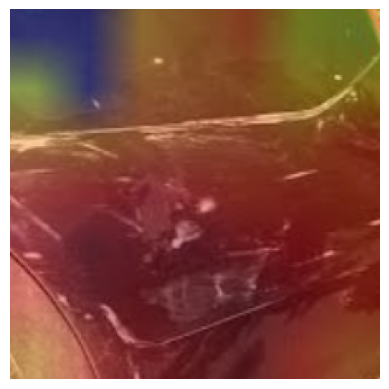

Epoch 5/100, Train Loss: 0.2941, Train Accuracy: 65.65%, Validation Loss: 0.2887, Validation Accuracy: 63.71%


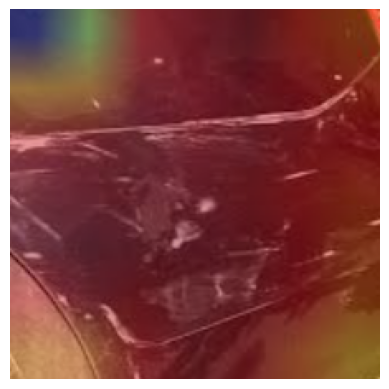

Epoch 6/100, Train Loss: 0.2493, Train Accuracy: 71.37%, Validation Loss: 0.2610, Validation Accuracy: 63.71%


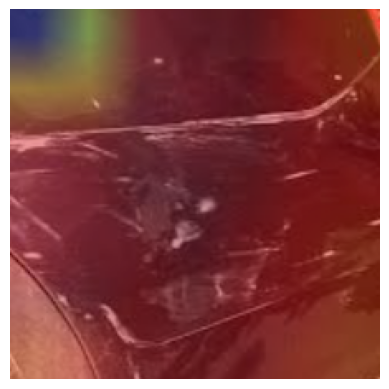

Epoch 7/100, Train Loss: 0.2406, Train Accuracy: 72.38%, Validation Loss: 0.2872, Validation Accuracy: 68.95%


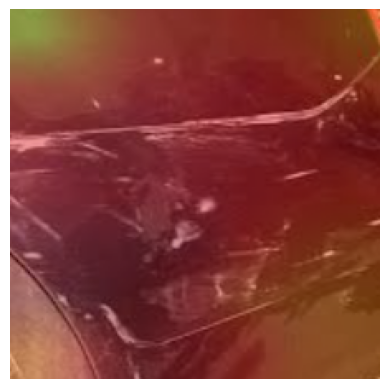

Epoch 8/100, Train Loss: 0.2305, Train Accuracy: 75.27%, Validation Loss: 0.2615, Validation Accuracy: 71.37%


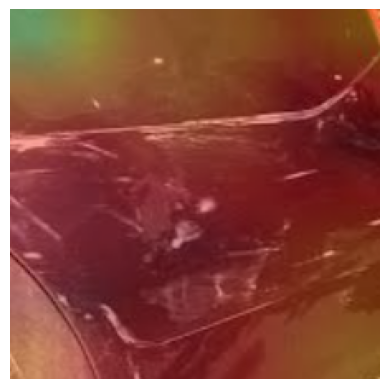

Epoch 9/100, Train Loss: 0.2290, Train Accuracy: 74.48%, Validation Loss: 0.3503, Validation Accuracy: 63.71%


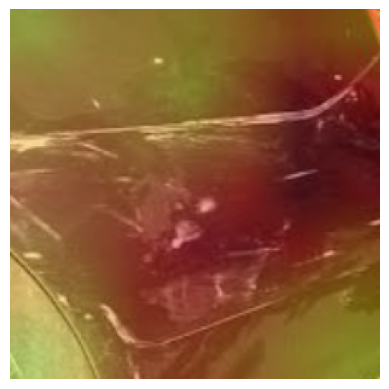

Epoch 00010: reducing learning rate of group 0 to 1.0000e-05.
Epoch 10/100, Train Loss: 0.2242, Train Accuracy: 74.91%, Validation Loss: 0.3075, Validation Accuracy: 65.73%


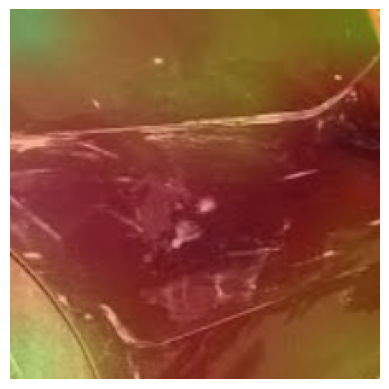

Epoch 11/100, Train Loss: 0.1931, Train Accuracy: 77.37%, Validation Loss: 0.2810, Validation Accuracy: 66.13%


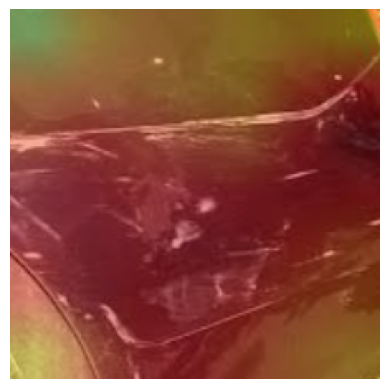

Epoch 12/100, Train Loss: 0.1754, Train Accuracy: 80.91%, Validation Loss: 0.2908, Validation Accuracy: 66.53%


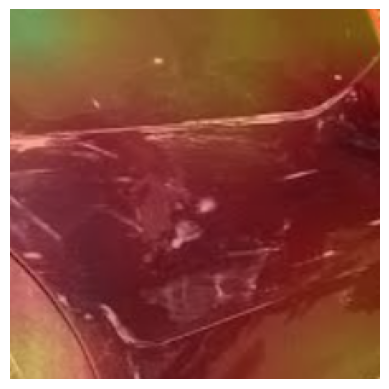

Epoch 13/100, Train Loss: 0.1554, Train Accuracy: 82.00%, Validation Loss: 0.2932, Validation Accuracy: 67.74%


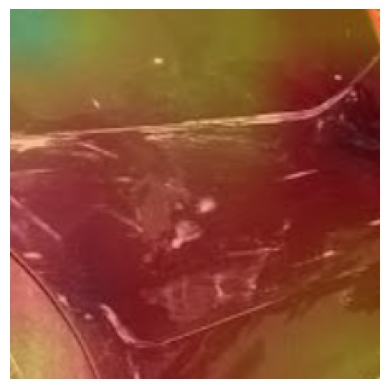

Epoch 14/100, Train Loss: 0.1460, Train Accuracy: 83.01%, Validation Loss: 0.2969, Validation Accuracy: 66.13%


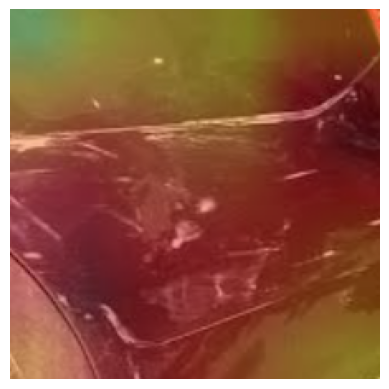

Epoch 15/100, Train Loss: 0.1522, Train Accuracy: 83.66%, Validation Loss: 0.3260, Validation Accuracy: 64.52%


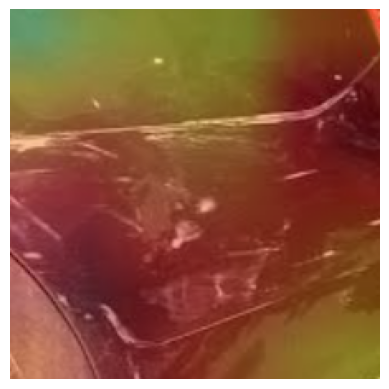

Epoch 00016: reducing learning rate of group 0 to 1.0000e-06.
Epoch 16/100, Train Loss: 0.1393, Train Accuracy: 83.22%, Validation Loss: 0.3140, Validation Accuracy: 63.71%


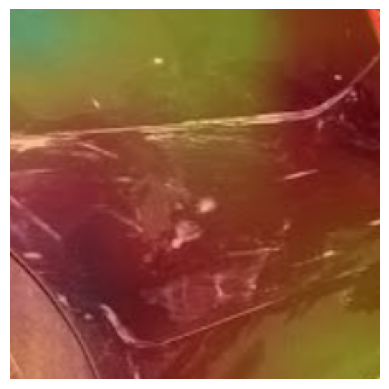

Epoch 17/100, Train Loss: 0.1323, Train Accuracy: 85.47%, Validation Loss: 0.3080, Validation Accuracy: 66.13%


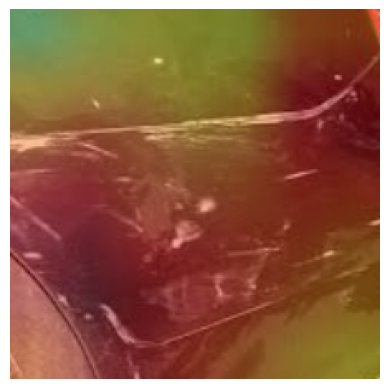

Epoch 18/100, Train Loss: 0.1501, Train Accuracy: 82.86%, Validation Loss: 0.3218, Validation Accuracy: 63.71%


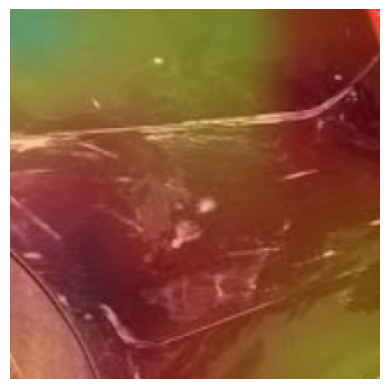

Epoch 19/100, Train Loss: 0.1503, Train Accuracy: 83.59%, Validation Loss: 0.3107, Validation Accuracy: 66.94%


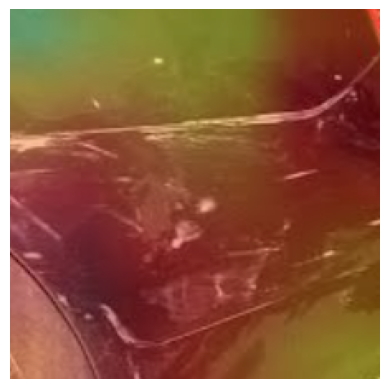

Epoch 20/100, Train Loss: 0.1429, Train Accuracy: 84.31%, Validation Loss: 0.3231, Validation Accuracy: 64.52%


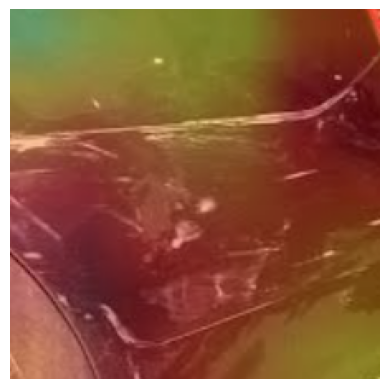

Epoch 21/100, Train Loss: 0.1382, Train Accuracy: 83.95%, Validation Loss: 0.3228, Validation Accuracy: 63.71%


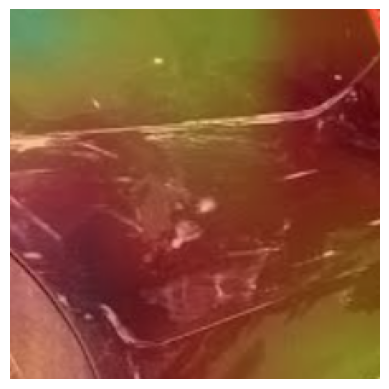

Epoch 00022: reducing learning rate of group 0 to 1.0000e-07.
Epoch 22/100, Train Loss: 0.1334, Train Accuracy: 85.32%, Validation Loss: 0.3142, Validation Accuracy: 65.32%


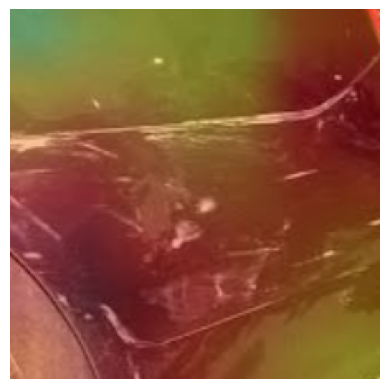

Epoch 23/100, Train Loss: 0.1266, Train Accuracy: 84.96%, Validation Loss: 0.3113, Validation Accuracy: 65.32%


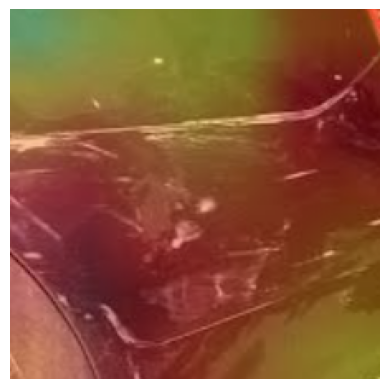

Epoch 24/100, Train Loss: 0.1316, Train Accuracy: 86.26%, Validation Loss: 0.3210, Validation Accuracy: 64.52%


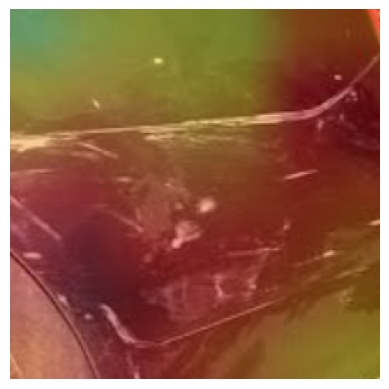

Epoch 25/100, Train Loss: 0.1352, Train Accuracy: 84.74%, Validation Loss: 0.3191, Validation Accuracy: 64.11%


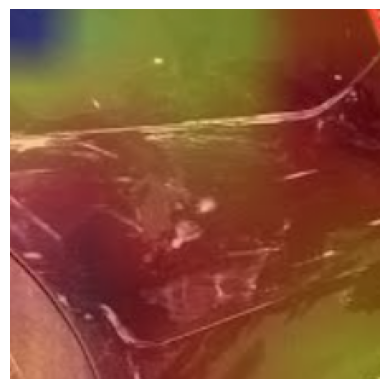

Epoch 26/100, Train Loss: 0.1352, Train Accuracy: 85.10%, Validation Loss: 0.3268, Validation Accuracy: 64.52%


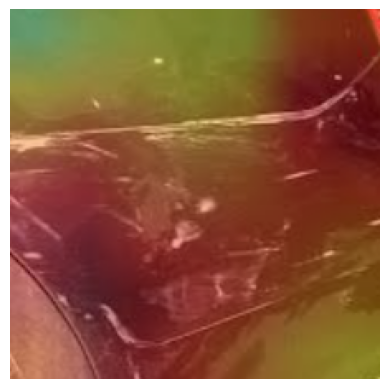

Epoch 27/100, Train Loss: 0.1372, Train Accuracy: 84.16%, Validation Loss: 0.3268, Validation Accuracy: 64.11%


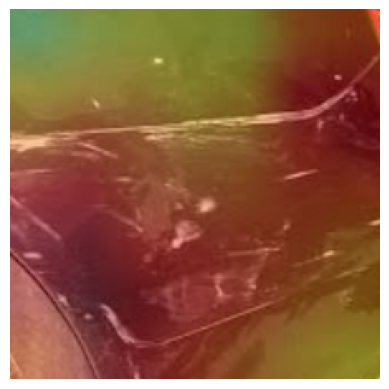

Epoch 00028: reducing learning rate of group 0 to 1.0000e-08.
Epoch 28/100, Train Loss: 0.1280, Train Accuracy: 86.62%, Validation Loss: 0.3207, Validation Accuracy: 63.71%


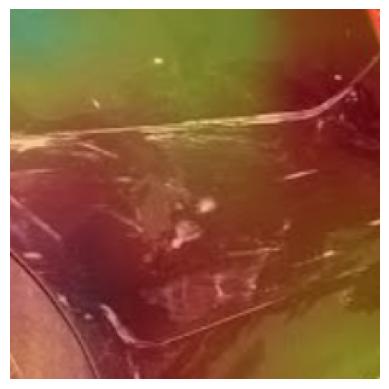

Epoch 29/100, Train Loss: 0.1284, Train Accuracy: 84.89%, Validation Loss: 0.3196, Validation Accuracy: 65.32%


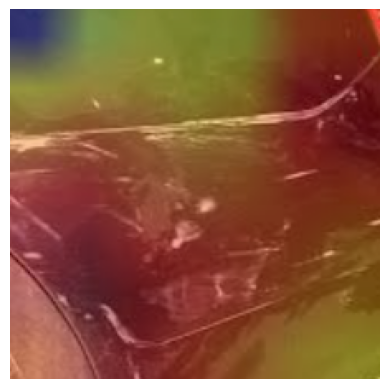

Epoch 30/100, Train Loss: 0.1270, Train Accuracy: 84.02%, Validation Loss: 0.3126, Validation Accuracy: 64.92%


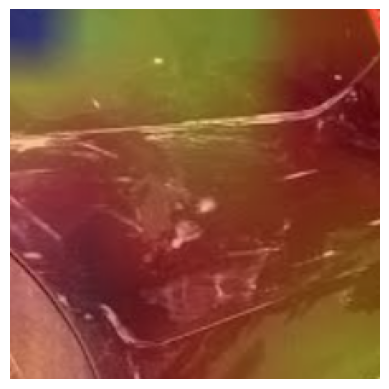

Epoch 31/100, Train Loss: 0.1407, Train Accuracy: 84.02%, Validation Loss: 0.3290, Validation Accuracy: 63.71%


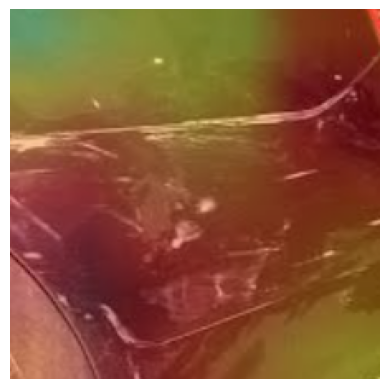

Epoch 32/100, Train Loss: 0.1391, Train Accuracy: 84.24%, Validation Loss: 0.3227, Validation Accuracy: 65.32%


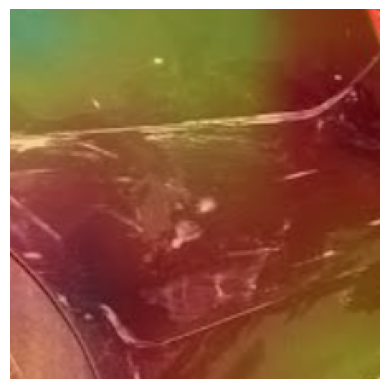

Epoch 33/100, Train Loss: 0.1271, Train Accuracy: 86.33%, Validation Loss: 0.3140, Validation Accuracy: 64.92%


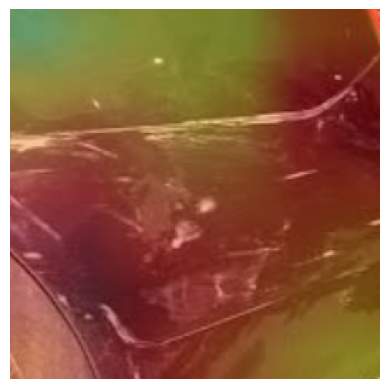

Epoch 34/100, Train Loss: 0.1247, Train Accuracy: 86.98%, Validation Loss: 0.3205, Validation Accuracy: 63.31%


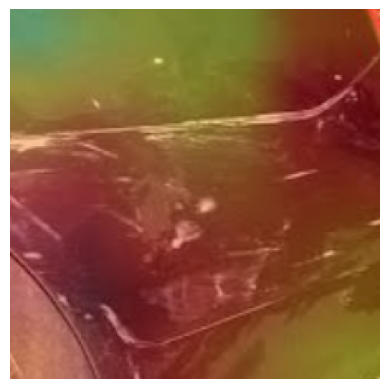

Epoch 35/100, Train Loss: 0.1409, Train Accuracy: 84.96%, Validation Loss: 0.3204, Validation Accuracy: 64.92%


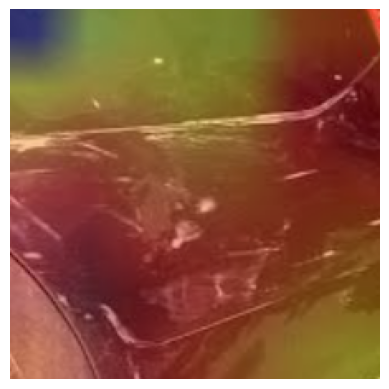

Epoch 36/100, Train Loss: 0.1288, Train Accuracy: 84.24%, Validation Loss: 0.3176, Validation Accuracy: 62.50%


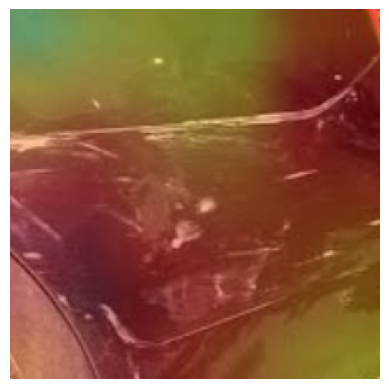

Epoch 37/100, Train Loss: 0.1305, Train Accuracy: 84.60%, Validation Loss: 0.3213, Validation Accuracy: 63.31%


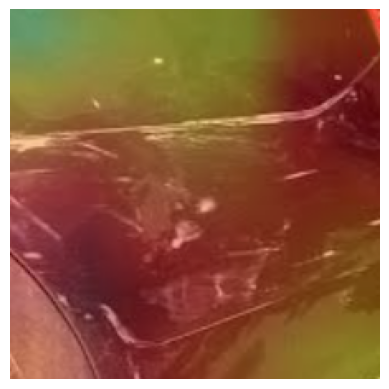

Epoch 38/100, Train Loss: 0.1252, Train Accuracy: 85.76%, Validation Loss: 0.3110, Validation Accuracy: 67.34%


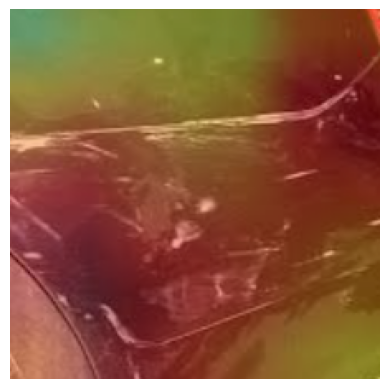

Epoch 39/100, Train Loss: 0.1274, Train Accuracy: 85.76%, Validation Loss: 0.3243, Validation Accuracy: 64.52%


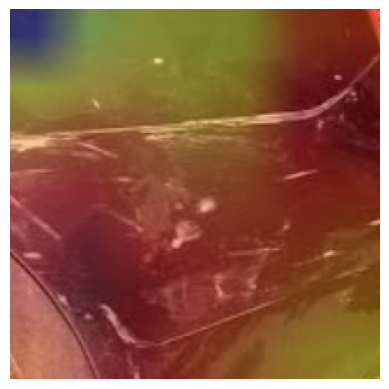

Epoch 40/100, Train Loss: 0.1356, Train Accuracy: 84.09%, Validation Loss: 0.3179, Validation Accuracy: 63.71%


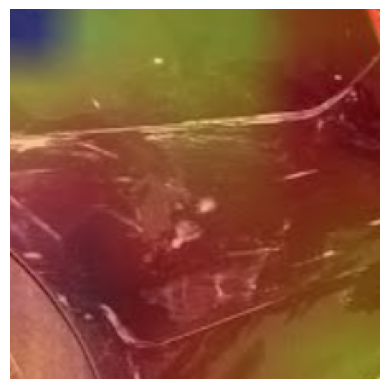

Epoch 41/100, Train Loss: 0.1355, Train Accuracy: 85.97%, Validation Loss: 0.3206, Validation Accuracy: 63.31%


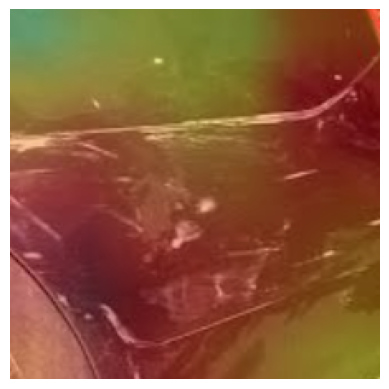

Epoch 42/100, Train Loss: 0.1344, Train Accuracy: 84.82%, Validation Loss: 0.3208, Validation Accuracy: 64.52%


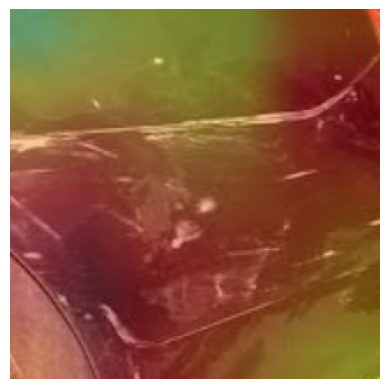

Epoch 43/100, Train Loss: 0.1386, Train Accuracy: 84.53%, Validation Loss: 0.3202, Validation Accuracy: 63.71%


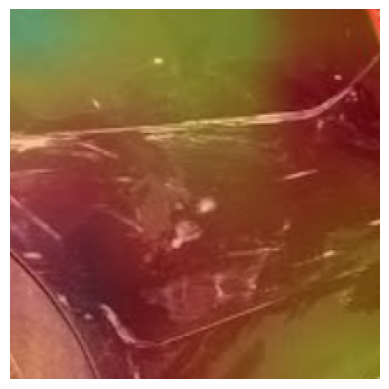

Epoch 44/100, Train Loss: 0.1364, Train Accuracy: 85.25%, Validation Loss: 0.3304, Validation Accuracy: 64.11%


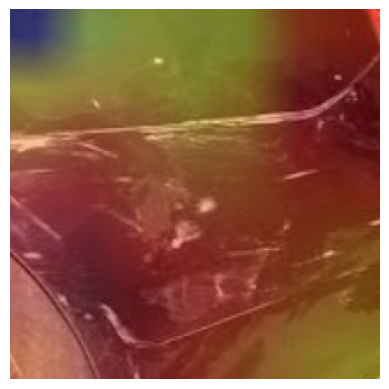

Epoch 45/100, Train Loss: 0.1467, Train Accuracy: 84.96%, Validation Loss: 0.3102, Validation Accuracy: 64.92%


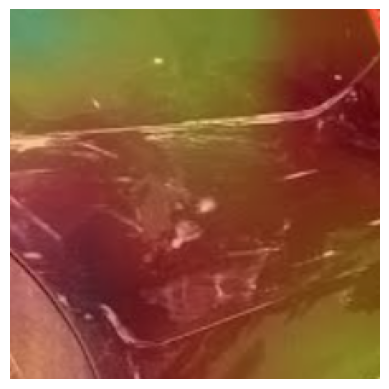

Epoch 46/100, Train Loss: 0.1459, Train Accuracy: 84.16%, Validation Loss: 0.3315, Validation Accuracy: 63.71%


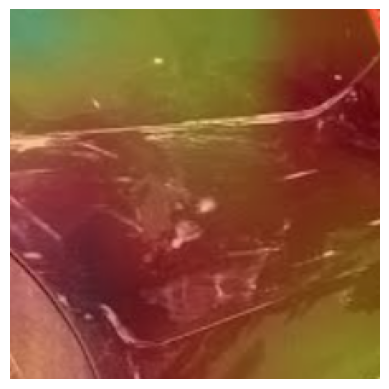

Epoch 47/100, Train Loss: 0.1372, Train Accuracy: 84.24%, Validation Loss: 0.3246, Validation Accuracy: 62.10%


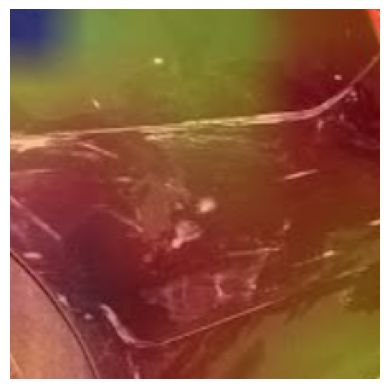

Epoch 48/100, Train Loss: 0.1232, Train Accuracy: 85.90%, Validation Loss: 0.3288, Validation Accuracy: 63.31%


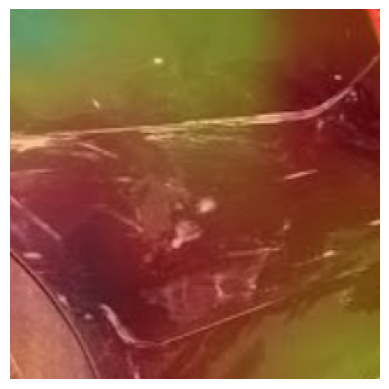

Epoch 49/100, Train Loss: 0.1287, Train Accuracy: 83.51%, Validation Loss: 0.3183, Validation Accuracy: 64.11%


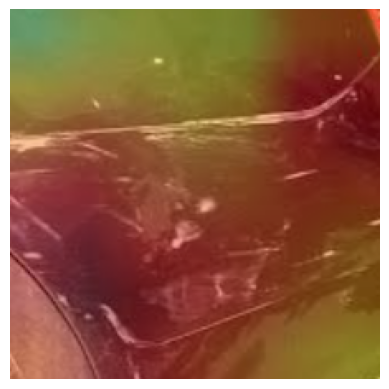

Epoch 50/100, Train Loss: 0.1381, Train Accuracy: 84.16%, Validation Loss: 0.3217, Validation Accuracy: 64.52%


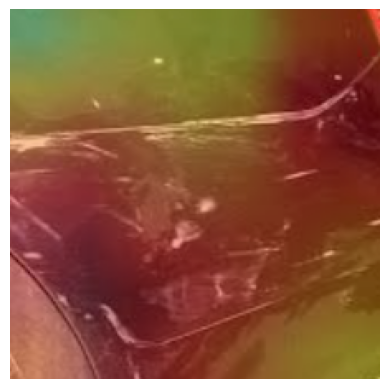

Epoch 51/100, Train Loss: 0.1531, Train Accuracy: 84.16%, Validation Loss: 0.3193, Validation Accuracy: 64.92%


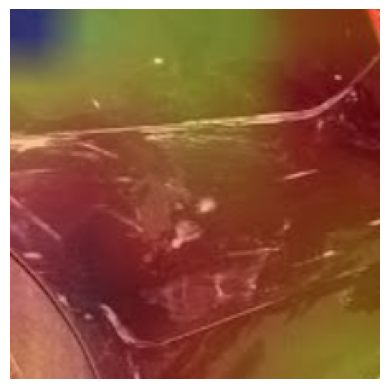

Epoch 52/100, Train Loss: 0.1342, Train Accuracy: 85.47%, Validation Loss: 0.3177, Validation Accuracy: 64.52%


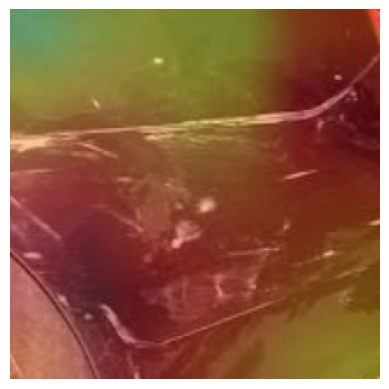

Epoch 53/100, Train Loss: 0.1472, Train Accuracy: 84.89%, Validation Loss: 0.3130, Validation Accuracy: 64.92%


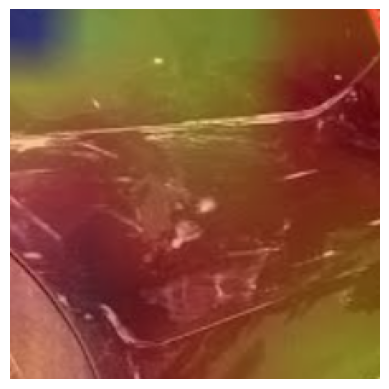

Epoch 54/100, Train Loss: 0.1405, Train Accuracy: 82.86%, Validation Loss: 0.3190, Validation Accuracy: 64.52%


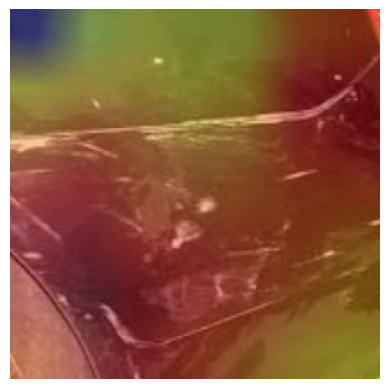

Epoch 55/100, Train Loss: 0.1336, Train Accuracy: 84.53%, Validation Loss: 0.3153, Validation Accuracy: 63.71%


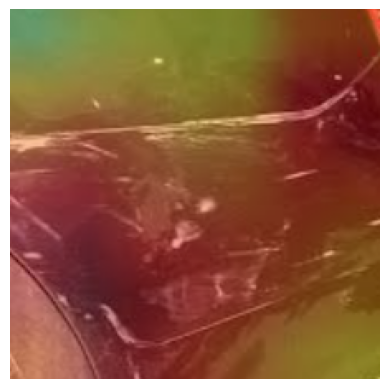

Epoch 56/100, Train Loss: 0.1263, Train Accuracy: 85.47%, Validation Loss: 0.3141, Validation Accuracy: 64.52%


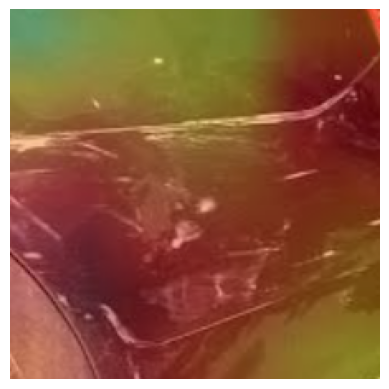

Epoch 57/100, Train Loss: 0.1351, Train Accuracy: 84.96%, Validation Loss: 0.3101, Validation Accuracy: 65.32%


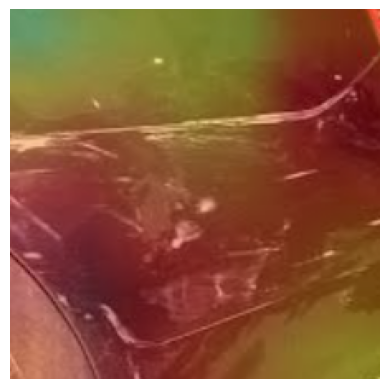

Epoch 58/100, Train Loss: 0.1197, Train Accuracy: 85.32%, Validation Loss: 0.3176, Validation Accuracy: 66.13%


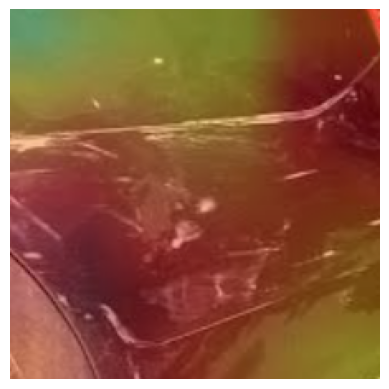

Epoch 59/100, Train Loss: 0.1280, Train Accuracy: 86.62%, Validation Loss: 0.3242, Validation Accuracy: 62.90%


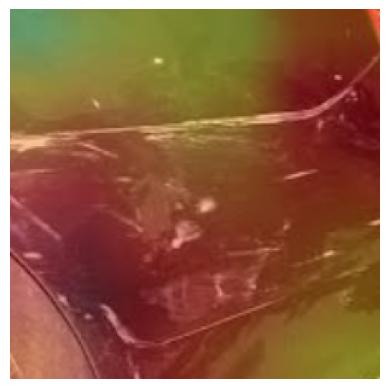

Epoch 60/100, Train Loss: 0.1331, Train Accuracy: 83.08%, Validation Loss: 0.3182, Validation Accuracy: 64.52%


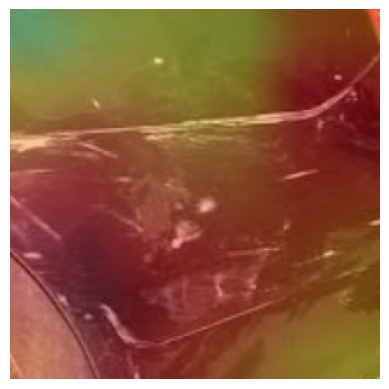

Epoch 61/100, Train Loss: 0.1433, Train Accuracy: 83.95%, Validation Loss: 0.3239, Validation Accuracy: 63.71%


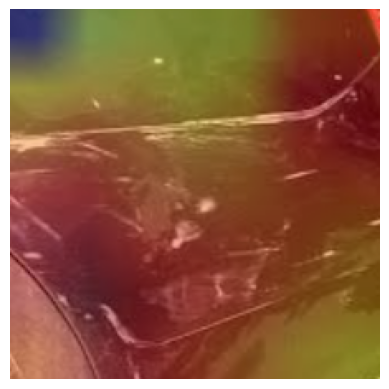

Epoch 62/100, Train Loss: 0.1275, Train Accuracy: 85.68%, Validation Loss: 0.3158, Validation Accuracy: 64.11%


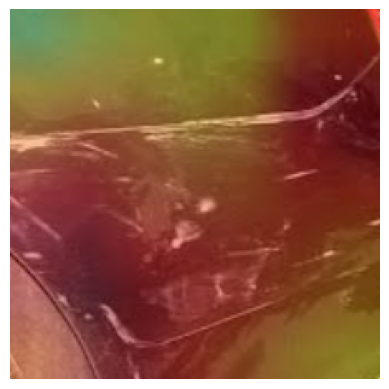

Epoch 63/100, Train Loss: 0.1315, Train Accuracy: 85.83%, Validation Loss: 0.3198, Validation Accuracy: 64.52%


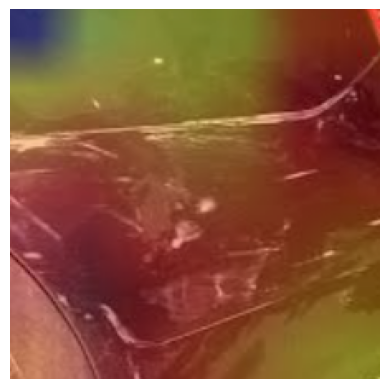

Epoch 64/100, Train Loss: 0.1306, Train Accuracy: 85.18%, Validation Loss: 0.3206, Validation Accuracy: 64.11%


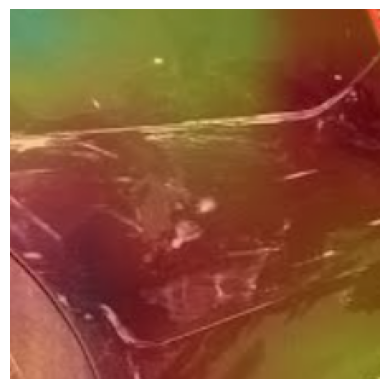

Epoch 65/100, Train Loss: 0.1299, Train Accuracy: 85.25%, Validation Loss: 0.3148, Validation Accuracy: 64.11%


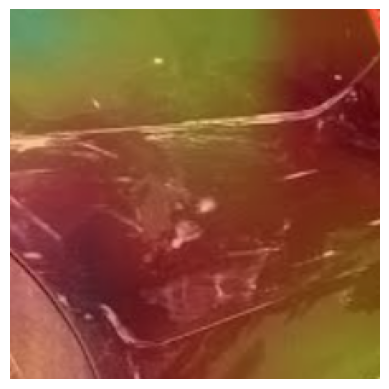

Epoch 66/100, Train Loss: 0.1333, Train Accuracy: 84.89%, Validation Loss: 0.3137, Validation Accuracy: 65.32%


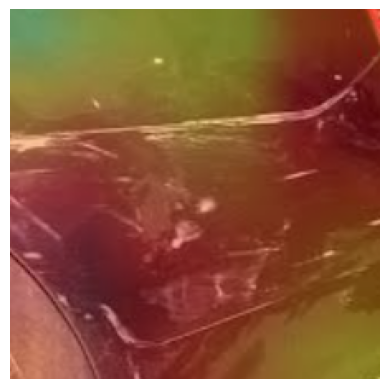

Epoch 67/100, Train Loss: 0.1264, Train Accuracy: 85.90%, Validation Loss: 0.3171, Validation Accuracy: 63.31%


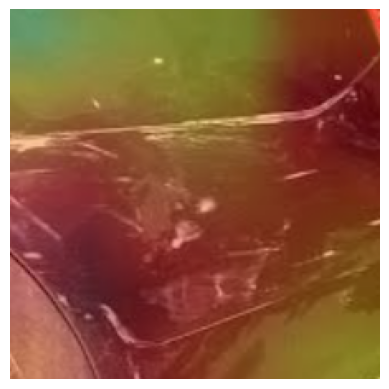

Epoch 68/100, Train Loss: 0.1319, Train Accuracy: 86.04%, Validation Loss: 0.3199, Validation Accuracy: 65.32%


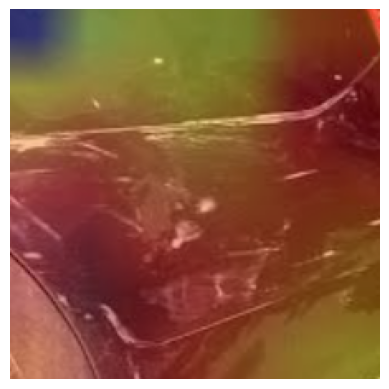

Epoch 69/100, Train Loss: 0.1257, Train Accuracy: 85.76%, Validation Loss: 0.3295, Validation Accuracy: 62.50%


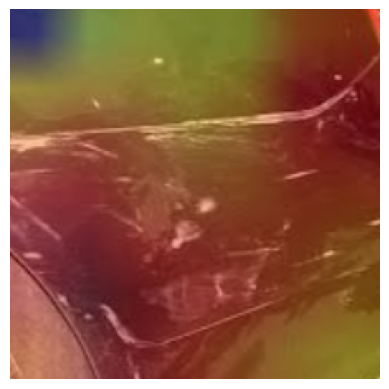

Epoch 70/100, Train Loss: 0.1419, Train Accuracy: 83.15%, Validation Loss: 0.3153, Validation Accuracy: 64.92%


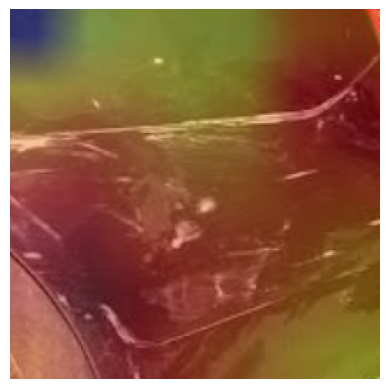

Epoch 71/100, Train Loss: 0.1510, Train Accuracy: 83.15%, Validation Loss: 0.3254, Validation Accuracy: 62.10%


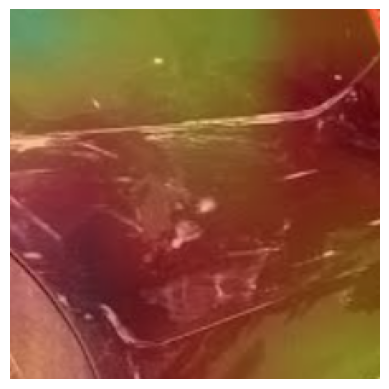

Epoch 72/100, Train Loss: 0.1299, Train Accuracy: 84.24%, Validation Loss: 0.3155, Validation Accuracy: 64.52%


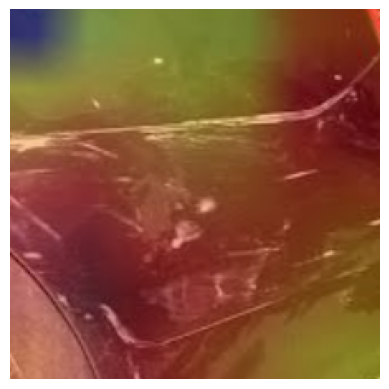

Epoch 73/100, Train Loss: 0.1293, Train Accuracy: 85.03%, Validation Loss: 0.3110, Validation Accuracy: 64.11%


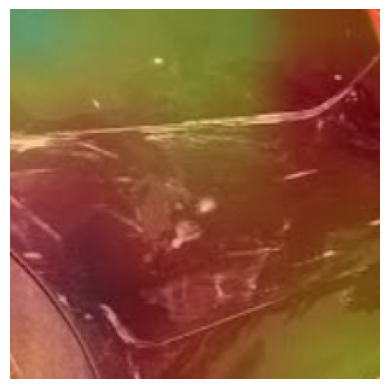

Epoch 74/100, Train Loss: 0.1392, Train Accuracy: 84.82%, Validation Loss: 0.3175, Validation Accuracy: 64.11%


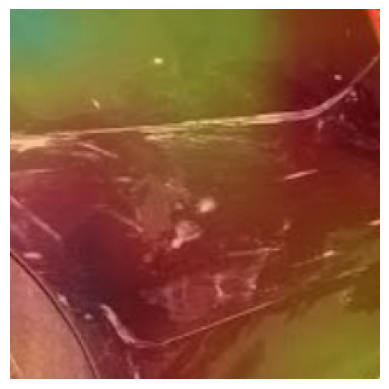

Epoch 75/100, Train Loss: 0.1445, Train Accuracy: 82.00%, Validation Loss: 0.3284, Validation Accuracy: 62.90%


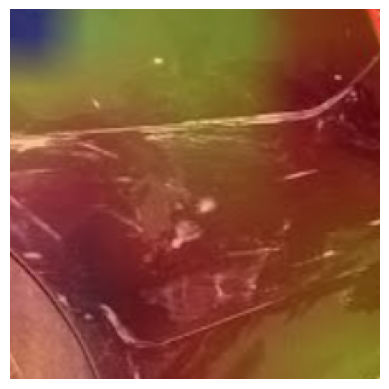

Epoch 76/100, Train Loss: 0.1399, Train Accuracy: 85.32%, Validation Loss: 0.3154, Validation Accuracy: 64.52%


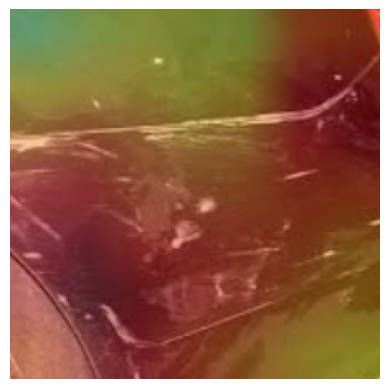

Epoch 77/100, Train Loss: 0.1355, Train Accuracy: 84.82%, Validation Loss: 0.3205, Validation Accuracy: 63.71%


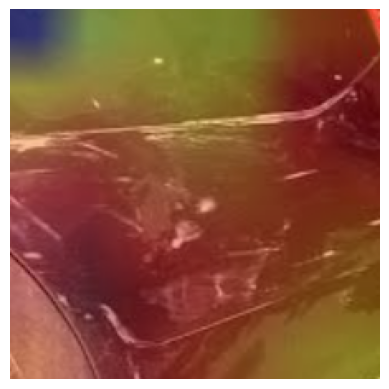

Epoch 78/100, Train Loss: 0.1370, Train Accuracy: 84.89%, Validation Loss: 0.3194, Validation Accuracy: 64.52%


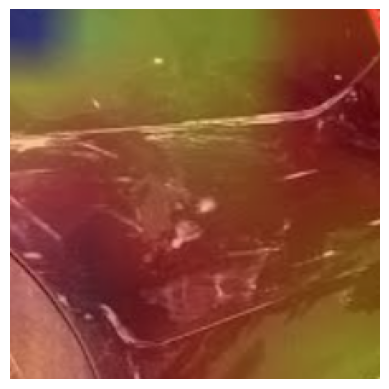

Epoch 79/100, Train Loss: 0.1436, Train Accuracy: 85.18%, Validation Loss: 0.3145, Validation Accuracy: 64.92%


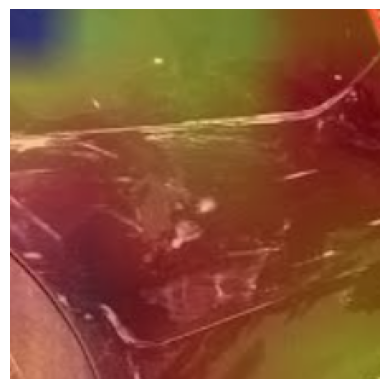

Epoch 80/100, Train Loss: 0.1287, Train Accuracy: 86.04%, Validation Loss: 0.3163, Validation Accuracy: 65.32%


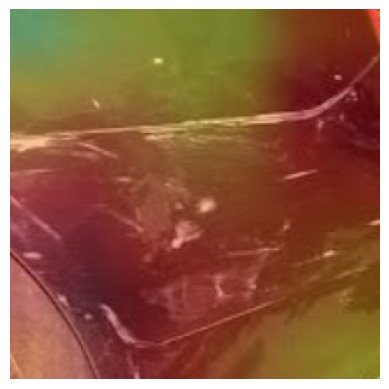

Epoch 81/100, Train Loss: 0.1279, Train Accuracy: 84.38%, Validation Loss: 0.3169, Validation Accuracy: 63.71%


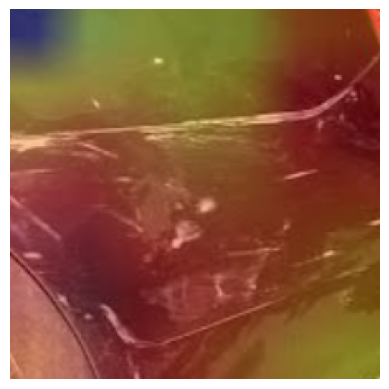

Epoch 82/100, Train Loss: 0.1389, Train Accuracy: 84.16%, Validation Loss: 0.3083, Validation Accuracy: 66.13%


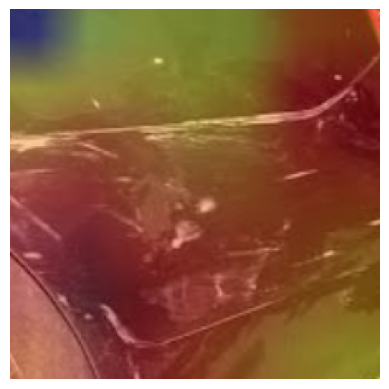

Epoch 83/100, Train Loss: 0.1372, Train Accuracy: 84.16%, Validation Loss: 0.3125, Validation Accuracy: 63.71%


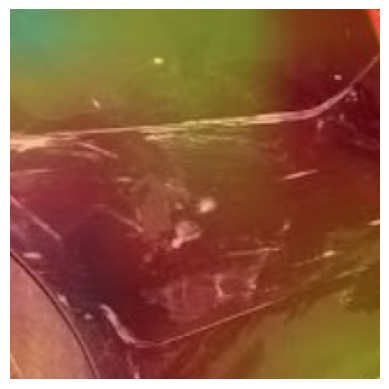

Epoch 84/100, Train Loss: 0.1307, Train Accuracy: 84.38%, Validation Loss: 0.3116, Validation Accuracy: 64.11%


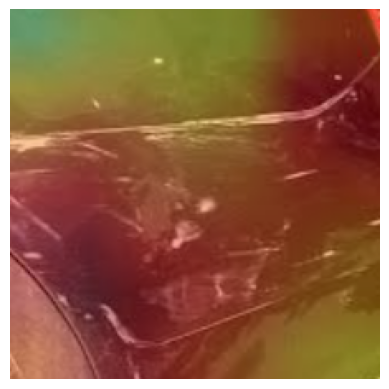

Epoch 85/100, Train Loss: 0.1343, Train Accuracy: 86.33%, Validation Loss: 0.3300, Validation Accuracy: 63.31%


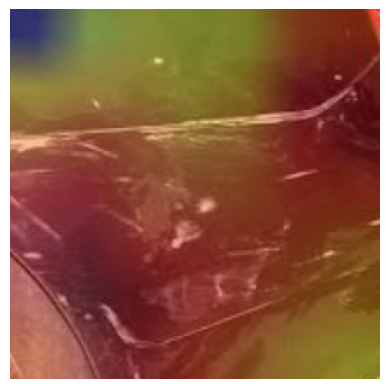

Epoch 86/100, Train Loss: 0.1311, Train Accuracy: 85.97%, Validation Loss: 0.3241, Validation Accuracy: 63.31%


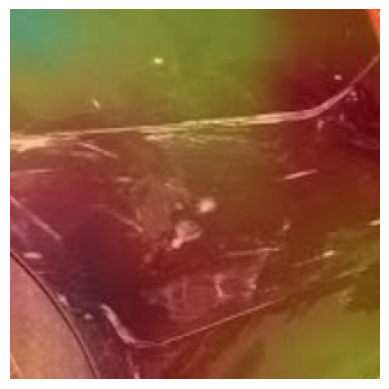

Epoch 87/100, Train Loss: 0.1457, Train Accuracy: 85.76%, Validation Loss: 0.3235, Validation Accuracy: 64.11%


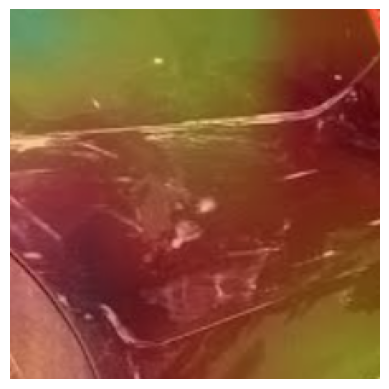

Epoch 88/100, Train Loss: 0.1281, Train Accuracy: 84.89%, Validation Loss: 0.3147, Validation Accuracy: 65.32%


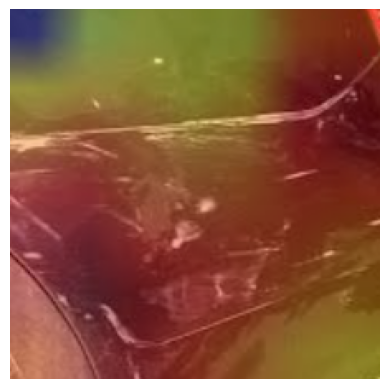

Epoch 89/100, Train Loss: 0.1312, Train Accuracy: 85.47%, Validation Loss: 0.3193, Validation Accuracy: 63.31%


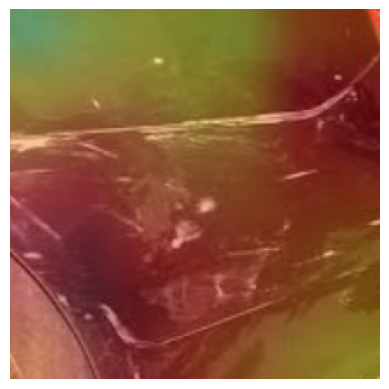

Epoch 90/100, Train Loss: 0.1265, Train Accuracy: 85.76%, Validation Loss: 0.3150, Validation Accuracy: 64.52%


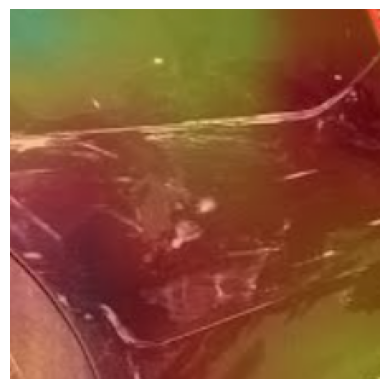

Epoch 91/100, Train Loss: 0.1349, Train Accuracy: 84.31%, Validation Loss: 0.3167, Validation Accuracy: 65.73%


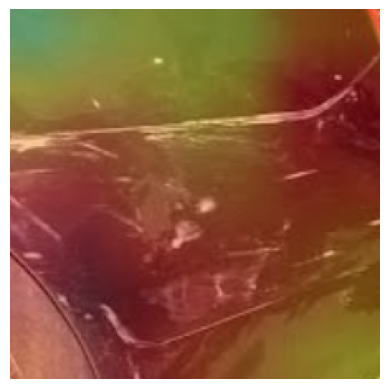

Epoch 92/100, Train Loss: 0.1360, Train Accuracy: 84.96%, Validation Loss: 0.3110, Validation Accuracy: 65.32%


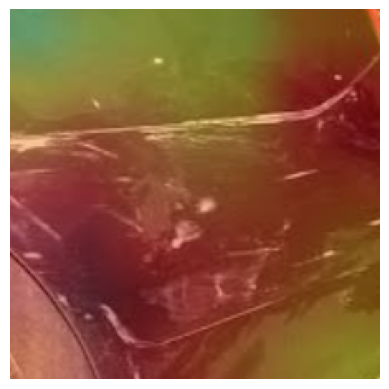

Epoch 93/100, Train Loss: 0.1425, Train Accuracy: 85.39%, Validation Loss: 0.3176, Validation Accuracy: 64.92%


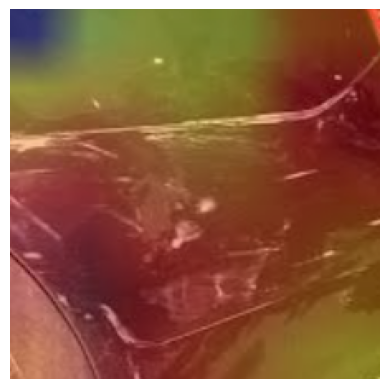

Epoch 94/100, Train Loss: 0.1360, Train Accuracy: 85.47%, Validation Loss: 0.3122, Validation Accuracy: 63.71%


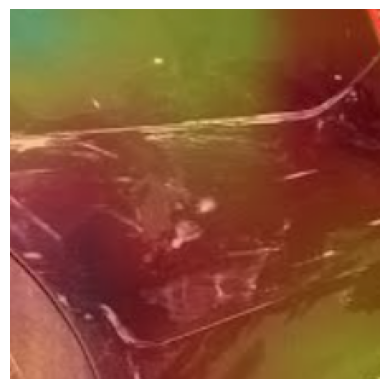

Epoch 95/100, Train Loss: 0.1241, Train Accuracy: 85.97%, Validation Loss: 0.3181, Validation Accuracy: 64.52%


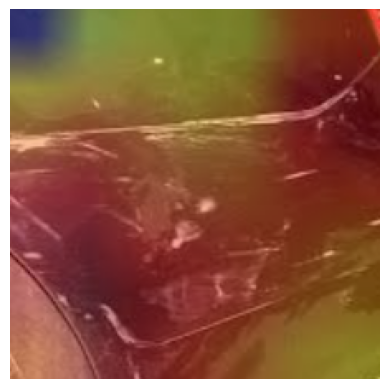

Epoch 96/100, Train Loss: 0.1246, Train Accuracy: 86.48%, Validation Loss: 0.3143, Validation Accuracy: 64.92%


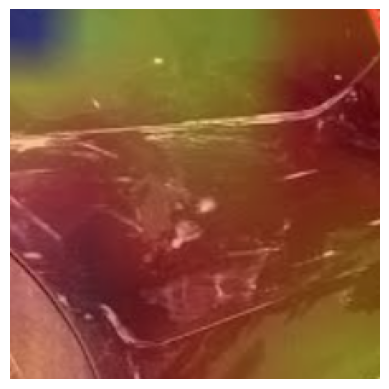

Epoch 97/100, Train Loss: 0.1251, Train Accuracy: 86.62%, Validation Loss: 0.3191, Validation Accuracy: 63.71%


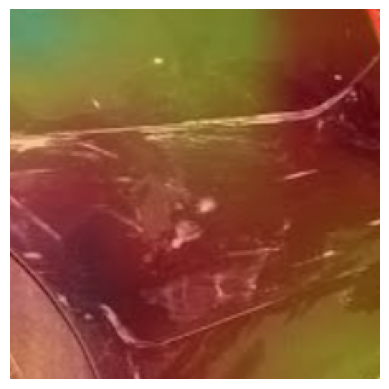

Epoch 98/100, Train Loss: 0.1445, Train Accuracy: 83.95%, Validation Loss: 0.3172, Validation Accuracy: 64.11%


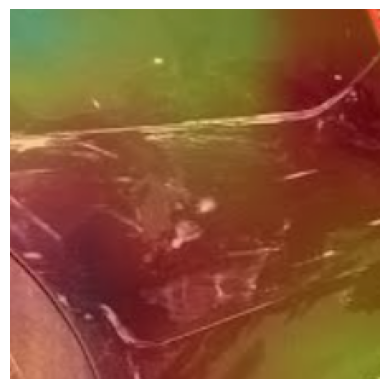

Epoch 99/100, Train Loss: 0.1396, Train Accuracy: 85.32%, Validation Loss: 0.3239, Validation Accuracy: 64.52%


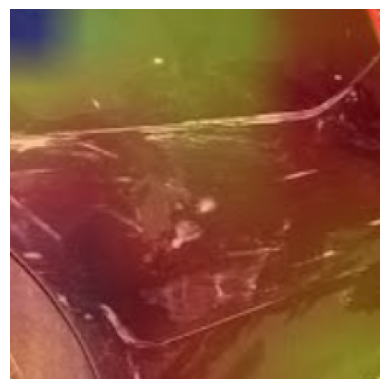

Epoch 100/100, Train Loss: 0.1463, Train Accuracy: 85.32%, Validation Loss: 0.3211, Validation Accuracy: 64.92%


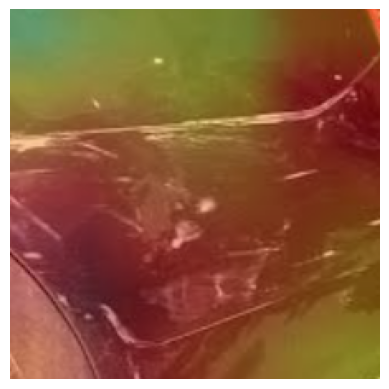

In [13]:
num_epochs = 100  # Adjust as per your requirement
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Initialize best validation loss to a high value
best_val_loss = float('inf')
best_model_weights = None

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Print epoch information
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

    # Check if this is the best model based on validation loss
    if val_loss < best_val_loss:
        print(f"Validation loss decreased ({best_val_loss:.4f} --> {val_loss:.4f}). Saving model ...")
        best_val_loss = val_loss
        best_model_weights = model.state_dict()

        # Save the model's state dictionary
        torch.save(best_model_weights, 'best_model_weights.pth')
        
    # Visualize attention map
    if epoch % 1 == 0:  # Adjust 'some_interval' as needed
        visualize_batch_attention(model, val_loader, device, threshold=0.5, alpha=0.4, num_images=1)


In [18]:
class ModifiedResNet(nn.Module):
    def __init__(self):
        super(ModifiedResNet, self).__init__()
        # Load pre-trained ResNet
        self.resnet = models.resnet50(pretrained=True)

        # Freeze the first few layers (for example, first 6 layers)
        layer_freeze = 6
        ct = 0
        for child in self.resnet.children():
            ct += 1
            if ct < layer_freeze:
                for param in child.parameters():
                    param.requires_grad = False

        # Replace the last fully connected layer of ResNet
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, 512)

        # Additional Fully Connected layers
        self.fc1 = nn.Linear(512, 256)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(256, 128)
        self.relu2 = nn.ReLU()

        # Final Fully Connected layer for classification
        self.fc_final = nn.Linear(128, 3)  # Assuming 3 classes for severity

    def forward(self, x):
        # Extract features from ResNet
        features = self.resnet(x)

        # Apply additional fully connected layers
        features = self.relu1(self.fc1(features))
        features = self.relu2(self.fc2(features))

        # Classification
        output = self.fc_final(features)
        
        return output

# Initialize the model
model = ModifiedResNet()

In [19]:
criterion = nn.CrossEntropyLoss()  # For classification tasks
optimizer = Adam(model.parameters(), lr=0.0001)
#optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [20]:
from torch.optim.lr_scheduler import StepLR

scheduler = StepLR(optimizer, step_size=7, gamma=0.1)
#scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=5, verbose=True)

In [21]:
num_epochs = 100  # Adjust as per your requirement
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Initialize best validation loss to a high value
best_val_loss = float('inf')
best_model_weights = None

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Print epoch information
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

    # Check if this is the best model based on validation loss
    if val_loss < best_val_loss:
        print(f"Validation loss decreased ({best_val_loss:.4f} --> {val_loss:.4f}). Saving model ...")
        best_val_loss = val_loss
        best_model_weights = model.state_dict()

/home/hous/anaconda3/envs/torch/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/100, Train Loss: 0.9643, Train Accuracy: 51.70%, Validation Loss: 0.6844, Validation Accuracy: 68.15%
Validation loss decreased (inf --> 0.6844). Saving model ...
Epoch 2/100, Train Loss: 0.8415, Train Accuracy: 59.87%, Validation Loss: 0.6463, Validation Accuracy: 72.18%
Validation loss decreased (0.6844 --> 0.6463). Saving model ...
Epoch 3/100, Train Loss: 0.7786, Train Accuracy: 63.63%, Validation Loss: 0.7926, Validation Accuracy: 58.87%
Epoch 4/100, Train Loss: 0.7698, Train Accuracy: 66.09%, Validation Loss: 0.6622, Validation Accuracy: 68.95%
Epoch 5/100, Train Loss: 0.7140, Train Accuracy: 67.61%, Validation Loss: 0.7749, Validation Accuracy: 66.94%
Epoch 6/100, Train Loss: 0.6780, Train Accuracy: 70.72%, Validation Loss: 0.8068, Validation Accuracy: 60.08%
Epoch 7/100, Train Loss: 0.6761, Train Accuracy: 70.21%, Validation Loss: 0.8104, Validation Accuracy: 65.73%
Epoch 8/100, Train Loss: 0.6159, Train Accuracy: 74.04%, Validation Loss: 0.6657, Validation Accuracy: 70

KeyboardInterrupt: 